# WATER QUALITY ANALYSIS AND CLASSIFICATION

## Content
The water_potability.csv file contains water quality metrics for 3276 different water bodies.

### 1. pH value:
PH is an important parameter in evaluating the acid–base balance of water. It is also the indicator of acidic or alkaline condition of water status. WHO has recommended maximum permissible limit of pH from 6.5 to 8.5. The current investigation ranges were 6.52–6.83 which are in the range of WHO standards.

### 2. Hardness:
Hardness is mainly caused by calcium and magnesium salts. These salts are dissolved from geologic deposits through which water travels. The length of time water is in contact with hardness producing material helps determine how much hardness there is in raw water. Hardness was originally defined as the capacity of water to precipitate soap caused by Calcium and Magnesium.

### 3. Solids (Total dissolved solids - TDS):
Water has the ability to dissolve a wide range of inorganic and some organic minerals or salts such as potassium, calcium, sodium, bicarbonates, chlorides, magnesium, sulfates etc. These minerals produced un-wanted taste and diluted color in appearance of water. This is the important parameter for the use of water. The water with high TDS value indicates that water is highly mineralized. Desirable limit for TDS is 500 mg/l and maximum limit is 1000 mg/l which prescribed for drinking purpose.

### 4. Chloramines:
Chlorine and chloramine are the major disinfectants used in public water systems. Chloramines are most commonly formed when ammonia is added to chlorine to treat drinking water. Chlorine levels up to 4 milligrams per liter (mg/L or 4 parts per million (ppm)) are considered safe in drinking water.

### 5. Sulfate:
Sulfates are naturally occurring substances that are found in minerals, soil, and rocks. They are present in ambient air, groundwater, plants, and food. The principal commercial use of sulfate is in the chemical industry. Sulfate concentration in seawater is about 2,700 milligrams per liter (mg/L). It ranges from 3 to 30 mg/L in most freshwater supplies, although much higher concentrations (1000 mg/L) are found in some geographic locations.

### 6. Conductivity:
Pure water is not a good conductor of electric current rather’s a good insulator. Increase in ions concentration enhances the electrical conductivity of water. Generally, the amount of dissolved solids in water determines the electrical conductivity. Electrical conductivity (EC) actually measures the ionic process of a solution that enables it to transmit current. According to WHO standards, EC value should not exceeded 400 μS/cm.

### 7. Organic_carbon:
Total Organic Carbon (TOC) in source waters comes from decaying natural organic matter (NOM) as well as synthetic sources. TOC is a measure of the total amount of carbon in organic compounds in pure water. According to US EPA < 2 mg/L as TOC in treated / drinking water, and < 4 mg/Lit in source water which is use for treatment.

### 8. Trihalomethanes:
THMs are chemicals which may be found in water treated with chlorine. The concentration of THMs in drinking water varies according to the level of organic material in the water, the amount of chlorine required to treat the water, and the temperature of the water that is being treated. THM levels up to 80 ppm is considered safe in drinking water.

### 9. Turbidity:
The turbidity of water depends on the quantity of solid matter present in the suspended state. It is a measure of light emitting properties of water and the test is used to indicate the quality of waste discharge with respect to colloidal matter. The mean turbidity value obtained for Wondo Genet Campus (0.98 NTU) is lower than the WHO recommended value of 5.00 NTU.

### 10. Potability:
Indicates if water is safe for human consumption where 1 means Potable and 0 means Not potable.

### Following are the list of algorithms that are used in this notebook.
- Algorithm
- Logistic Regression
- Decision Tree
- Random Forest
- XGBoost
- KNeighbours
- SVM
- AdaBoost

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
%matplotlib inline


import warnings
warnings.filterwarnings('ignore')


import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

In [2]:
# Loading water dataset
df = pd.read_csv("C:\\Users\\shash\\OneDrive\\Desktop\\Python Projects\\Water Quality Prediction\\water_potability.csv")

In [3]:
df.shape

(3276, 10)

In [4]:
df.columns

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

In [5]:
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [6]:
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


In [8]:
print(f"There are {df.shape[0]} data points and {len(df.columns)} features in the data.")

There are 3276 data points and 10 features in the data.


In [9]:
for i in df.columns:
    if df[i].isnull().sum() > 0:
        print(f"There are {df[i].isnull().sum()} null values in {i} column")

There are 491 null values in ph column
There are 781 null values in Sulfate column
There are 162 null values in Trihalomethanes column


In [10]:
# nunique: Tells the number of unique value in a every column
df.nunique()

ph                 2785
Hardness           3276
Solids             3276
Chloramines        3276
Sulfate            2495
Conductivity       3276
Organic_carbon     3276
Trihalomethanes    3114
Turbidity          3276
Potability            2
dtype: int64

In [11]:
df.isnull().sum()

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

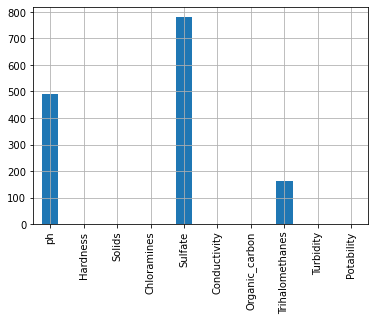

In [12]:
df.isnull().sum().plot(kind='bar')
plt.grid()

In [13]:
df.dtypes

ph                 float64
Hardness           float64
Solids             float64
Chloramines        float64
Sulfate            float64
Conductivity       float64
Organic_carbon     float64
Trihalomethanes    float64
Turbidity          float64
Potability           int64
dtype: object

<AxesSubplot:>

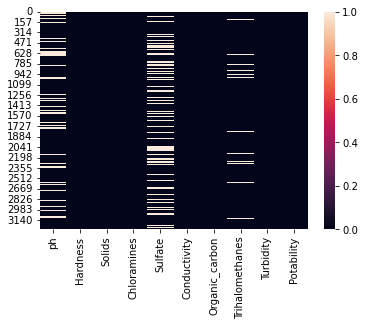

In [14]:
# Heat map of null values
sns.heatmap(df.isnull())

<AxesSubplot:>

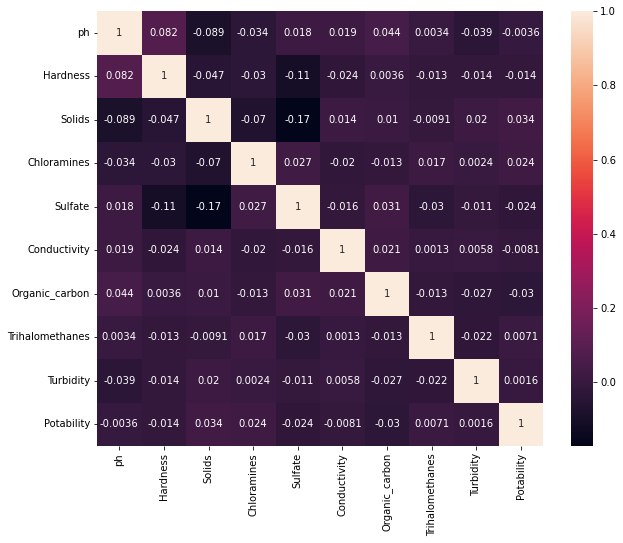

In [15]:
# Correlation heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), annot=True)

In [16]:
# Unstacking the correlation matrix to see the values more clearly.
corr = df.corr()
corr

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
ph,1.000000,0.082096,-0.089288,-0.034350,0.018203,0.018614,0.043503,0.003354,-0.039057,-0.003556
Hardness,0.082096,1.000000,-0.046899,-0.030054,-0.106923,-0.023915,0.003610,-0.013013,-0.014449,-0.013837
Solids,-0.089288,-0.046899,1.000000,-0.070148,-0.171804,0.013831,0.010242,-0.009143,0.019546,0.033743
Chloramines,-0.034350,-0.030054,-0.070148,1.000000,0.027244,-0.020486,-0.012653,0.017084,0.002363,0.023779
Sulfate,0.018203,-0.106923,-0.171804,0.027244,1.000000,-0.016121,0.030831,-0.030274,-0.011187,-0.023577
Conductivity,0.018614,-0.023915,0.013831,-0.020486,-0.016121,1.000000,0.020966,0.001285,0.005798,-0.008128
Organic_carbon,0.043503,0.003610,0.010242,-0.012653,0.030831,0.020966,1.000000,-0.013274,-0.027308,-0.030001
Trihalomethanes,0.003354,-0.013013,-0.009143,0.017084,-0.030274,0.001285,-0.013274,1.000000,-0.022145,0.007130
Turbidity,-0.039057,-0.014449,0.019546,0.002363,-0.011187,0.005798,-0.027308,-0.022145,1.000000,0.001581
Potability,-0.003556,-0.013837,0.033743,0.023779,-0.023577,-0.008128,-0.030001,0.007130,0.001581,1.000000


In [17]:
# abs(): gives absolute value
c1 = corr.abs().unstack()
c1

ph          ph                 1.000000
            Hardness           0.082096
            Solids             0.089288
            Chloramines        0.034350
            Sulfate            0.018203
                                 ...   
Potability  Conductivity       0.008128
            Organic_carbon     0.030001
            Trihalomethanes    0.007130
            Turbidity          0.001581
            Potability         1.000000
Length: 100, dtype: float64

In [18]:
c1.sort_values(ascending=False)[12:24:2]

Hardness  Sulfate           0.106923
ph        Solids            0.089288
Hardness  ph                0.082096
Solids    Chloramines       0.070148
Hardness  Solids            0.046899
ph        Organic_carbon    0.043503
dtype: float64

# Exploratory Data Analysis

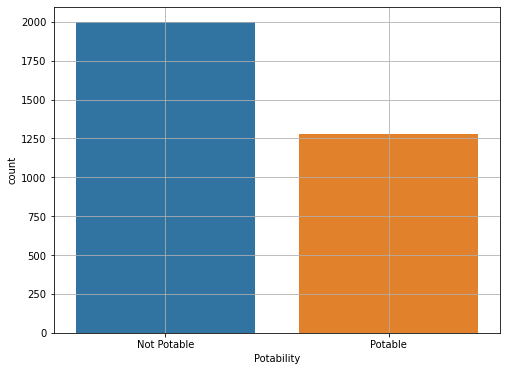

In [19]:
plt.figure(figsize=(8,6))
sns.countplot(x=df.Potability)
plt.xticks(ticks=[0,1], labels=["Not Potable", "Potable"])
plt.grid()

In [20]:
df.Potability.value_counts()

0    1998
1    1278
Name: Potability, dtype: int64

<AxesSubplot:xlabel='Potability', ylabel='ph'>

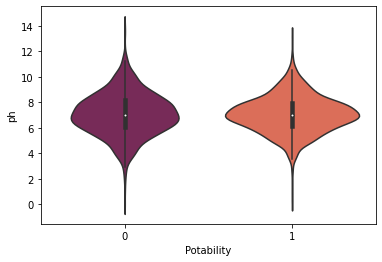

In [21]:
sns.violinplot(data=df, x='Potability', y='ph', palette='rocket', split=True)

##### rcParams
matplotlib.rcParams contains some properties in matplotlibrc file. We can use it to control the defaults of almost every property in Matplotlib: figure size and DPI, line width, color and style, axes, axis and grid properties, text and font properties and so on

array([[<AxesSubplot:title={'center':'ph'}>,
        <AxesSubplot:title={'center':'Hardness'}>,
        <AxesSubplot:title={'center':'Solids'}>],
       [<AxesSubplot:title={'center':'Chloramines'}>,
        <AxesSubplot:title={'center':'Sulfate'}>,
        <AxesSubplot:title={'center':'Conductivity'}>],
       [<AxesSubplot:title={'center':'Organic_carbon'}>,
        <AxesSubplot:title={'center':'Trihalomethanes'}>,
        <AxesSubplot:title={'center':'Turbidity'}>],
       [<AxesSubplot:title={'center':'Potability'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

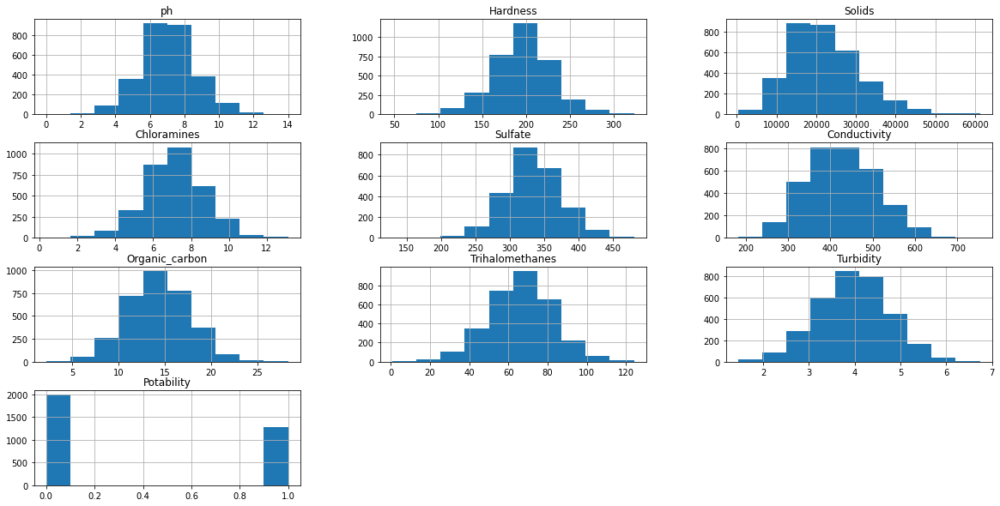

In [22]:
plt.rcParams['figure.figsize'] = [20,10]
df.hist()


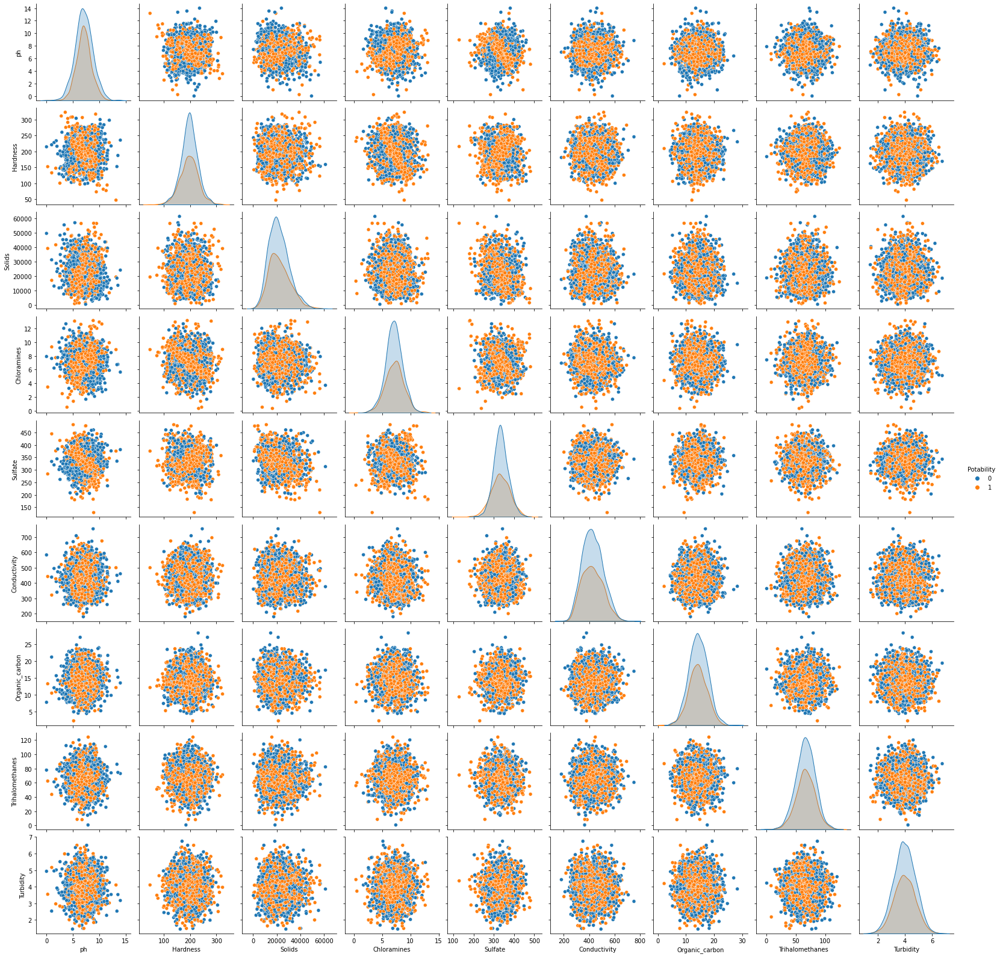

In [23]:
sns.pairplot(df, hue="Potability")

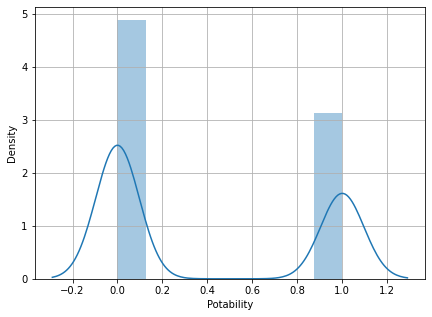

In [24]:
plt.figure(figsize=(7,5))
sns.distplot(df.Potability)
plt.grid()

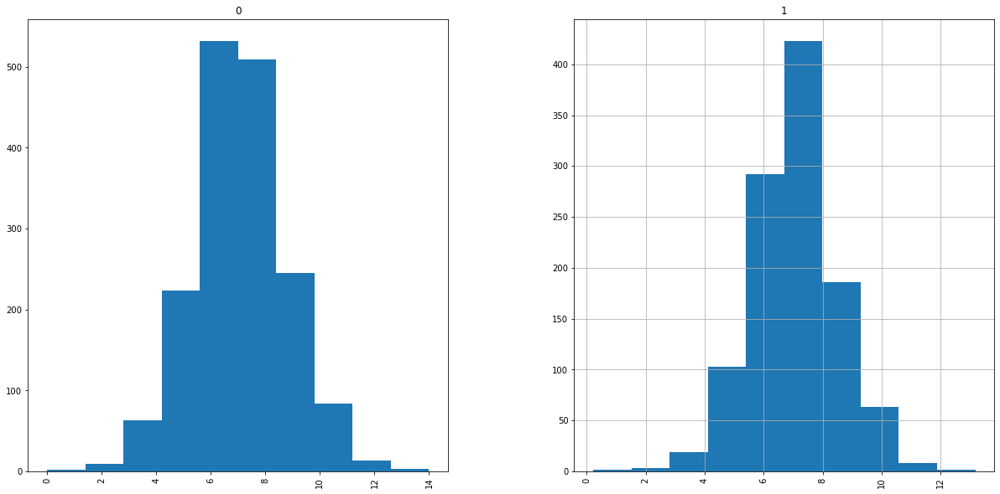

In [25]:
# Histogram for "ph" by Potability
df.hist(column='ph', by='Potability')
plt.grid()

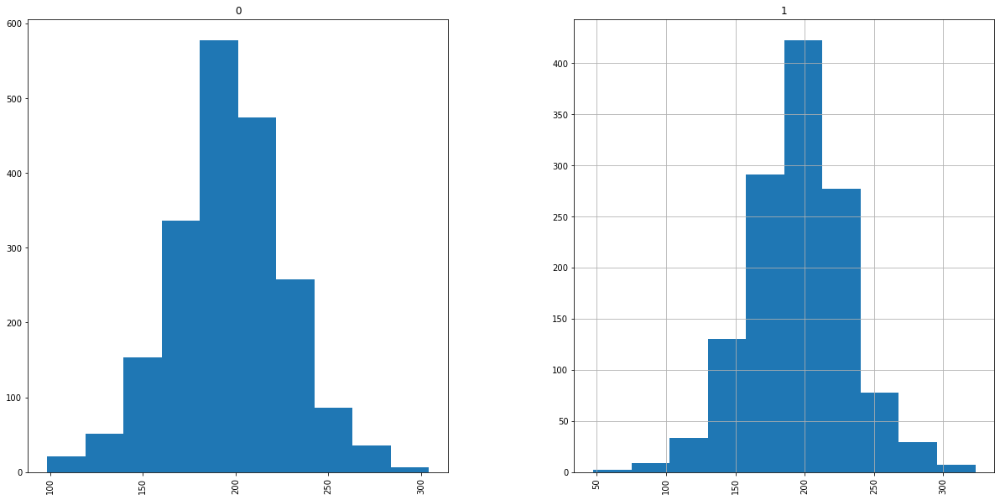

In [26]:
# Histogram for "Hardness" by Potability
df.hist(column='Hardness', by='Potability')
plt.grid()

<AxesSubplot:xlabel='Hardness', ylabel='Count'>

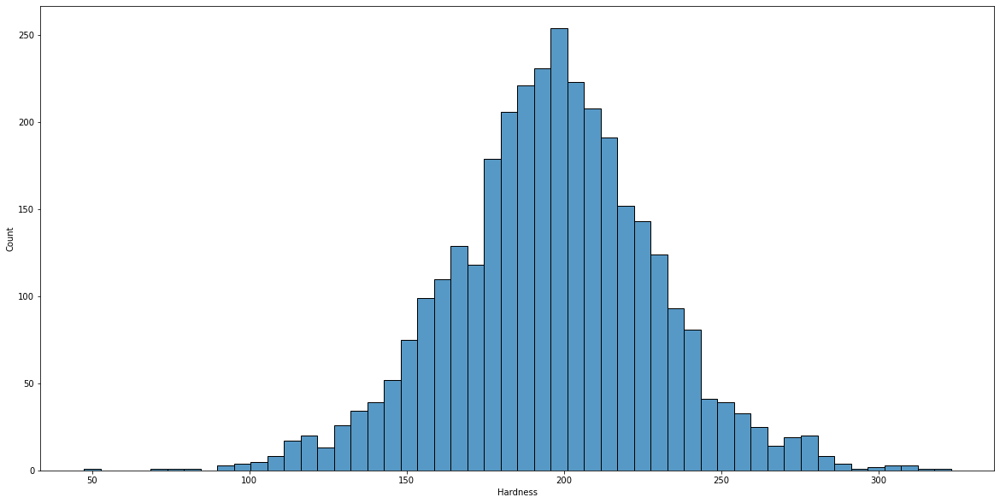

In [27]:
sns.histplot(data=df, x='Hardness')

In [28]:
df.nunique()

ph                 2785
Hardness           3276
Solids             3276
Chloramines        3276
Sulfate            2495
Conductivity       3276
Organic_carbon     3276
Trihalomethanes    3114
Turbidity          3276
Potability            2
dtype: int64

In [29]:
# Skewness
df.skew().sort_values(ascending=False)

Solids             0.621634
Potability         0.450784
Conductivity       0.264490
ph                 0.025630
Organic_carbon     0.025533
Turbidity         -0.007817
Chloramines       -0.012098
Sulfate           -0.035947
Hardness          -0.039342
Trihalomethanes   -0.083031
dtype: float64

- Using pandas skew function to check the correlation between the values.
- Values between 0.5 to -0.5 will be considered as the normal distribution else will be skewed depending upon the skewness value.

#### Individual box plot for each feature using PLOTLY

In [30]:
# Box plot for "ph" column
px.box(data_frame= df, x=df.Potability, y=df.ph, color="Potability", width=800, height=500)

In [31]:
df.columns

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

In [32]:
# Box plot for "Hardness" column
px.box(data_frame=df, x=df.Potability, y=df.Hardness, color=df.Potability, height=500, width=800)

In [33]:
# Box plot for "Solids" column
px.box(data_frame=df, x=df.Potability, y=df.Solids, color=df.Potability, width=800, height=500)

In [34]:
# Box plot for "Chloramines" column
px.box(data_frame=df, x=df.Potability, y=df.Chloramines, color=df.Potability, width=800, height=500)

In [35]:
# Box plot for "Sulphate" column
px.box(data_frame=df, x=df.Potability, y=df.Sulfate, color=df.Potability, width=800, height=500)

In [36]:
# Box plot for "Conductivity" column
px.box(data_frame=df, x=df.Potability, y=df.Conductivity, color=df.Potability, width=800, height=500)

In [37]:
# Box plot for "Organic Carbon" column
px.box(data_frame=df, x=df.Potability, y=df.Organic_carbon, color=df.Potability, width=800, height=500)

In [38]:
# Box plot for "Trihalomethanes" column
px.box(data_frame=df, x=df.Potability, y=df.Trihalomethanes, color=df.Potability, width=800, height=500)

In [39]:
# Box plot for "Turbidity" column
px.box(data_frame=df, x=df.Potability, y=df.Turbidity, color=df.Potability, width=800, height=500)

### Histogram using plotly

In [40]:
# Histogram of ph v/s potability
px.histogram(data_frame=df, x=df.ph, facet_row=df.Potability, color=df.Potability, template='plotly_dark')

In [41]:
# Histogram of Hardness v/s potability
px.histogram(data_frame=df, x=df.Hardness, color=df.Potability, facet_row=df.Potability, template='plotly_dark')

In [42]:
# Histogram of Solids v/s potability
px.histogram(data_frame=df, x=df.Solids, color=df.Potability, facet_row=df.Potability, template='seaborn')

In [43]:
# Histogram of Sulphate v/s potability
px.histogram(data_frame=df, x=df.Sulfate, color=df.Potability, facet_row=df.Potability, template='plotly_white')

In [44]:
# Histogram of Chloramines v/s potability
px.histogram(data_frame=df, x=df.Chloramines, color=df.Potability, facet_row=df.Potability, template='ggplot2')

In [45]:
# Potability PIEPLOT
px.pie(data_frame=df, names=df.Potability , hole=0.4, template='plotly_dark')

# Scatter Plots using PLOTLY

In [46]:
# ph v/s Sulphate
px.scatter(data_frame=df, x=df.ph, y=df.Sulfate, color=df.Potability, template='plotly_dark', trendline='ols')

In [47]:
# Organic_Carbo v/s Hardness
px.scatter(data_frame=df, x=df.Organic_carbon, y=df.Hardness, color=df.Potability, template="ggplot2", trendline="lowess")

In [48]:
# Chloramines v/s Turbidity
px.scatter(data_frame=df, x=df.Organic_carbon, y=df.Chloramines, color=df.Turbidity, template="plotly_dark", trendline="lowess")

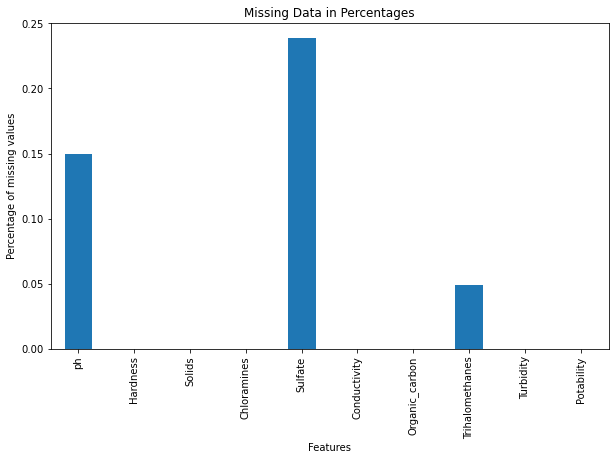

In [49]:
df.isnull().mean().plot.bar(figsize=(10,6)) 
plt.ylabel('Percentage of missing values') 
plt.xlabel('Features') 
plt.title('Missing Data in Percentages');

### Filling Null Values

In [50]:
df['ph'] = df['ph'].fillna(df['ph'].mean())  # for ph
df['Sulfate'] = df['Sulfate'].fillna(df['Sulfate'].mean())  # for Sulphate
df['Trihalomethanes'] = df['Trihalomethanes'].fillna(df['Trihalomethanes'].mean())  # for Trihalomethanes

In [51]:
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.080795,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,333.775777,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,333.775777,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


<AxesSubplot:>

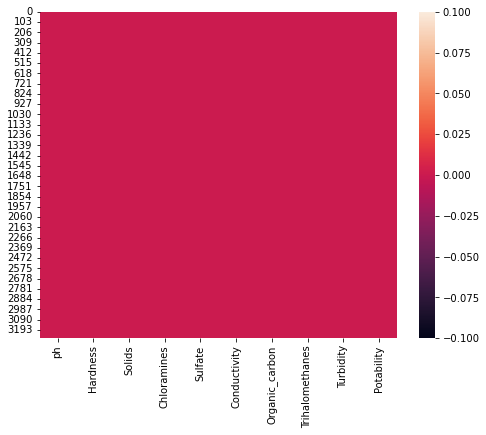

In [52]:
plt.figure(figsize=(8, 6))
sns.heatmap(df.isnull())

In [53]:
df.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

# Train Test Split

In [54]:
X = df.drop('Potability', axis=1)
y = df['Potability']

In [55]:
from sklearn.model_selection import train_test_split

In [56]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

### Scaling The Data

In [57]:
from sklearn.preprocessing import StandardScaler

In [58]:
scaler = StandardScaler()

In [59]:
X_train = scaler.fit_transform(X_train)

In [60]:
X_train

array([[-0.81482114, -0.28383166,  1.69805484, ..., -0.86790121,
         0.68057373, -0.41286298],
       [-0.50674381, -1.17305797, -0.77620121, ..., -1.53308051,
        -1.81970934,  1.90799769],
       [-2.01624159, -0.45103038,  0.41696773, ..., -1.5005676 ,
        -1.27513582,  0.24327549],
       ...,
       [-1.50004651, -0.69662437, -0.83310727, ..., -1.98036332,
        -1.77565489, -1.06734861],
       [-0.59207976,  0.22708309, -0.74113018, ...,  0.1076333 ,
         0.2699133 ,  0.21995631],
       [ 0.42441877,  1.04895157, -1.67879997, ..., -0.00354071,
         0.47523679,  0.25739572]])

# USING LOGISTIC REGRESSION

In [61]:
from sklearn.linear_model import LogisticRegression

In [62]:
log_model = LogisticRegression()

In [63]:
# Fitting the data
log_model.fit(X_train, y_train)

LogisticRegression()

In [64]:
# Making Prediction
log_prediction = log_model.predict(X_test)

In [65]:
# Metrics
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay

In [66]:
# Accuracy Score
accuracy_score(y_test, log_prediction)

0.38657171922685657

In [68]:
# Classification Report of Logistic Regression
print(classification_report(y_test, log_prediction))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00       603
           1       0.39      1.00      0.56       380

    accuracy                           0.39       983
   macro avg       0.19      0.50      0.28       983
weighted avg       0.15      0.39      0.22       983



In [ ]:
# Confusion matrix of Logistic Model